# 9. Image Matching

## Table of Contents
1. [Libraries](#libraries)
1. [ORB Matching](#orb)
1. [SIFT Matching](#sift)
1. [Homework](#homework)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [3]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np

# ORB (Oriented FAST and Rotated BRIEF) <a class="anchor" id="orb" ></a>

- Developed at OpenCV labs by Ethan Rublee, Vincent Rabaud, Kurt Konolige, and Gary R. Bradski in 2011
- Efficient and viable alternative to SIFT and SURF (patented algorithms)
- ORB is free to use
- Feature detection
- ORB builds on FAST keypoint detector + BRIEF descriptor

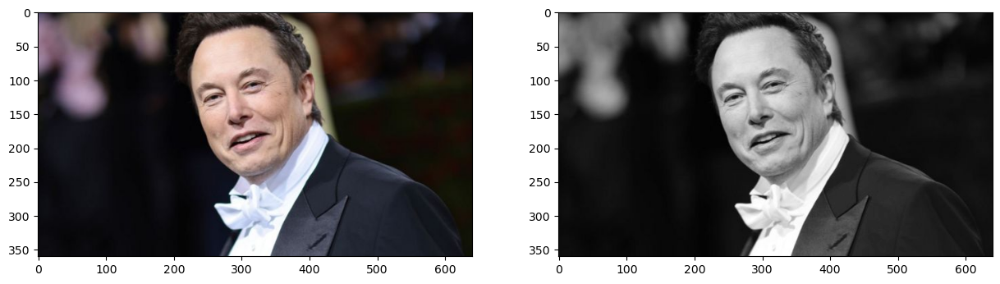

In [4]:
#reading image
img = cv2.imread('data/elon_1.jpg')  
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### Create test image by adding Scale Invariance and Rotational Invariance

In [5]:
test_image = cv2.pyrDown(img_color)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

### Display traning image and testing image

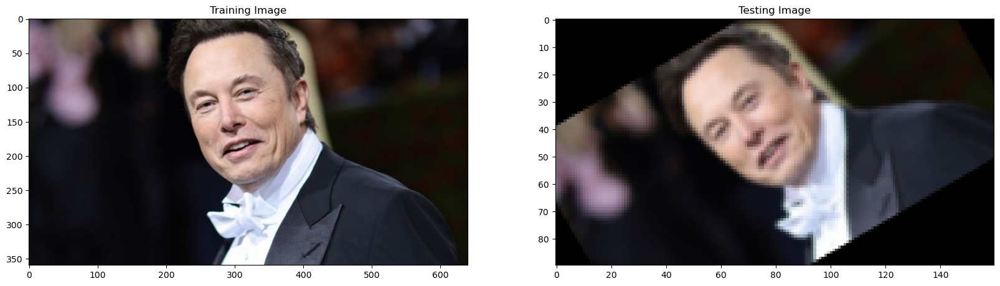

In [6]:
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(img_color)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)

### ORB

In [7]:
orb = cv2.ORB_create()

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  42


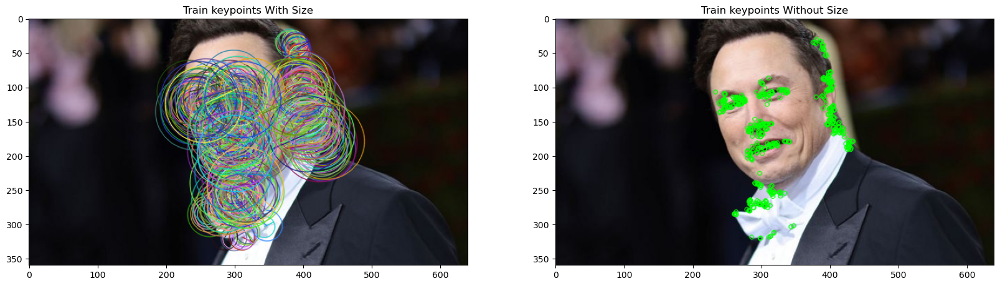

In [8]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

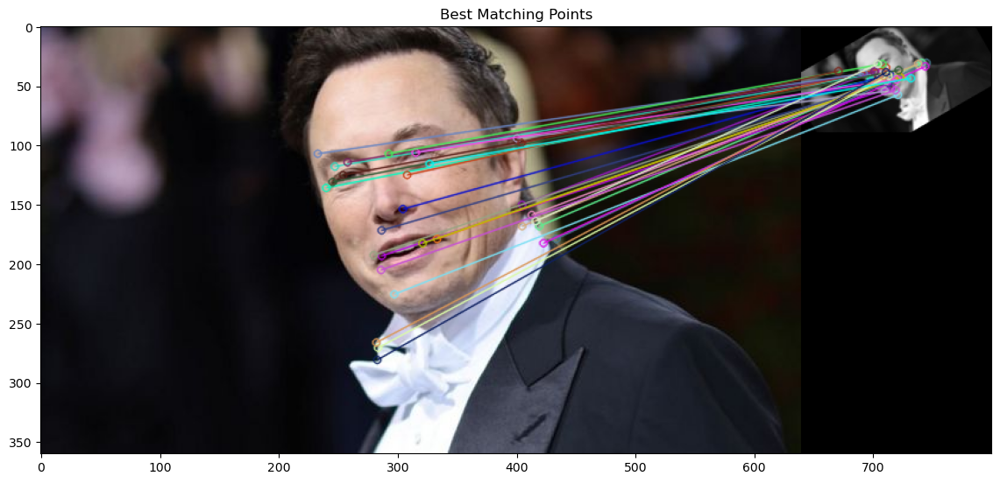


Number of Matching Keypoints Between The Training and Query Images:  30


In [9]:

# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## SIFT Matching (Scale Invariant Feature Transform) <a class="anchor" id="sift" ></a>

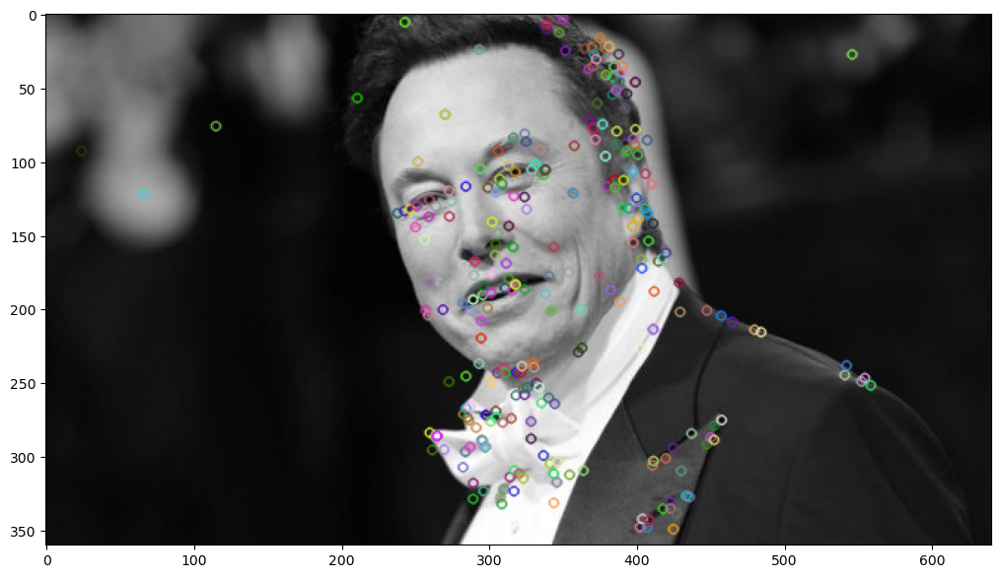

In [10]:
img1 = cv2.imread('data/elon_1.jpg')  
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

### Matching different images

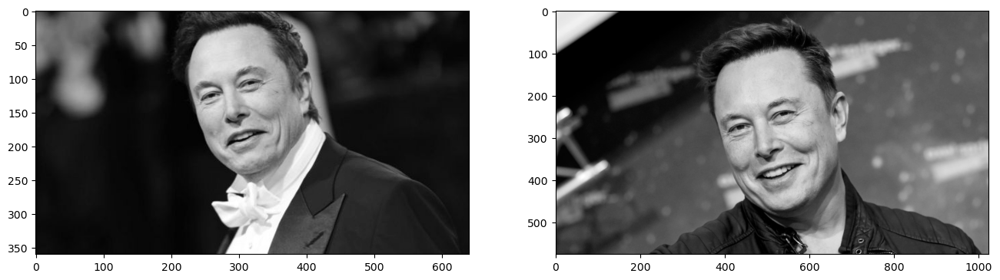

In [11]:
# read images
img1 = cv2.imread('data/elon_1.jpg')  
img2 = cv2.imread('data/elon_2.png') 

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

### Extracting Keypoints with SIFT

In [12]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(291, 734)

### Feature Matching

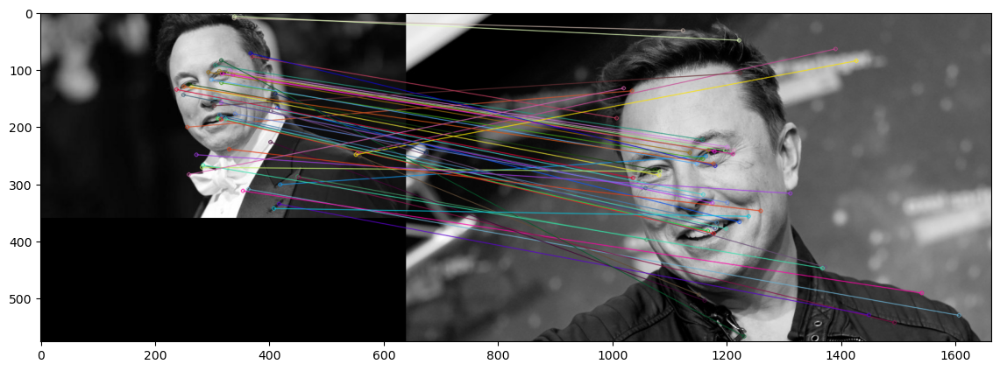

(<matplotlib.image.AxesImage at 0x14c4d9730>, None)

In [13]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

## Homework <a class="anchor" id="homework" ></a>

We'll analyze different scenarios for the feature matches outside a human face, which was already showcased in the notebook. We'll use the following samples:

1. A car (same model in different scenarios).
2. A city skyline (different angles, useful to detect places).
3. A church (a highly recognized and famous place).

In [23]:
def applyORB(img):
    img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    test_image = cv2.pyrDown(img_color)
    test_image = cv2.pyrDown(test_image)
    num_rows, num_cols = test_image.shape[:2]

    rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
    test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

    test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

    fx, plots = plt.subplots(1, 2, figsize=(20,10))

    plt.figure(figsize=(14, 4))
    plots[0].set_title("Training Image")
    plots[0].imshow(img_color)
    plots[1].set_title("Testing Image")
    plots[1].imshow(test_image)
    plt.show()

    orb = cv2.ORB_create()

    train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
    test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

    keypoints_without_size = np.copy(img_color)
    keypoints_with_size = np.copy(img_color)

    cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

    cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Display image with and without keypoints size
    plt.figure(figsize=(14, 4))
    fx, plots = plt.subplots(1, 2, figsize=(20,10))
    plots[0].set_title("Train keypoints With Size")
    plots[0].imshow(keypoints_with_size, cmap='gray')
    plots[1].set_title("Train keypoints Without Size")
    plots[1].imshow(keypoints_without_size, cmap='gray')
    plt.show()

    # Print the number of keypoints detected in the training image
    print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

    # Print the number of keypoints detected in the query image
    print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

    # Create a Brute Force Matcher object.
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

    # Perform the matching between the ORB descriptors of the training image and the test image
    matches = bf.match(train_descriptor, test_descriptor)

    # The matches with shorter distance are the ones we want.
    matches = sorted(matches, key = lambda x : x.distance)

    result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

    # Display the best matching points
    plt.figure(figsize=(18, 8))
    plt.rcParams['figure.figsize'] = [14.0, 7.0]
    plt.title('Best Matching Points')
    plt.imshow(result)
    plt.show()

    # Print total number of matching points between the training and query images
    print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

In [40]:
def applySIFT(img, img_test):
    img1 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(img_test, cv2.COLOR_BGR2GRAY)

    plt.figure(figsize=(14, 4))
    plt.suptitle('Original images to match with SIFT:', fontsize=16)

    ax1 = plt.subplot(1, 2, 1)
    ax2 = plt.subplot(1, 2, 2)

    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cmap='gray')
    ax2.imshow(cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB), cmap='gray')

    plt.show()

    sift = cv2.SIFT_create()

    keypoints_1, descriptors_1 = sift.detectAndCompute(img1, None)
    keypoints_2, descriptors_2 = sift.detectAndCompute(img2, None)

    plt.figure(figsize=(18, 6))
    plt.suptitle('Keypoints detected:', fontsize=16)
    plt.imshow(cv2.drawKeypoints(img1,keypoints_1,img))
    plt.show()

    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

    matches = bf.match(descriptors_1, descriptors_2)
    matches = sorted(matches, key=lambda x: x.distance)

    img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:70], img2, flags=2)

    plt.title('SIFT applied:')
    plt.imshow(img3)
    plt.show()



### Car matching:

##### ORB:

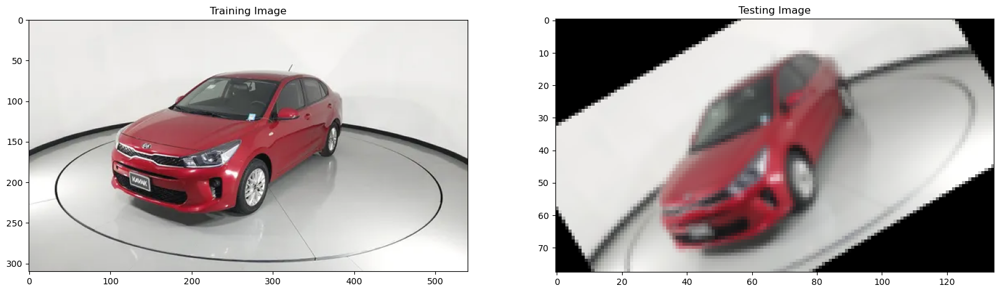

<Figure size 1400x400 with 0 Axes>

<Figure size 1400x400 with 0 Axes>

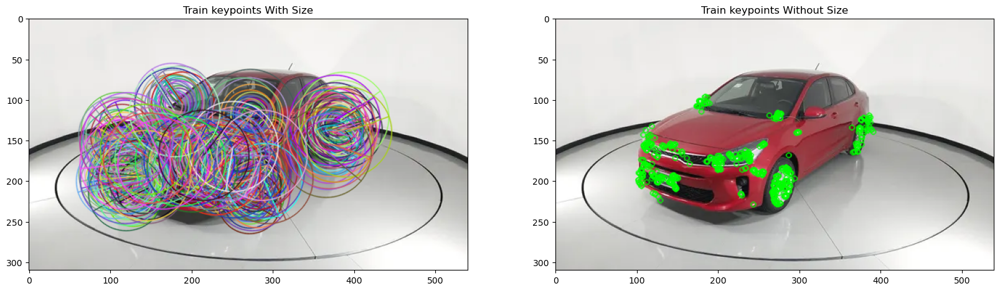

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  14


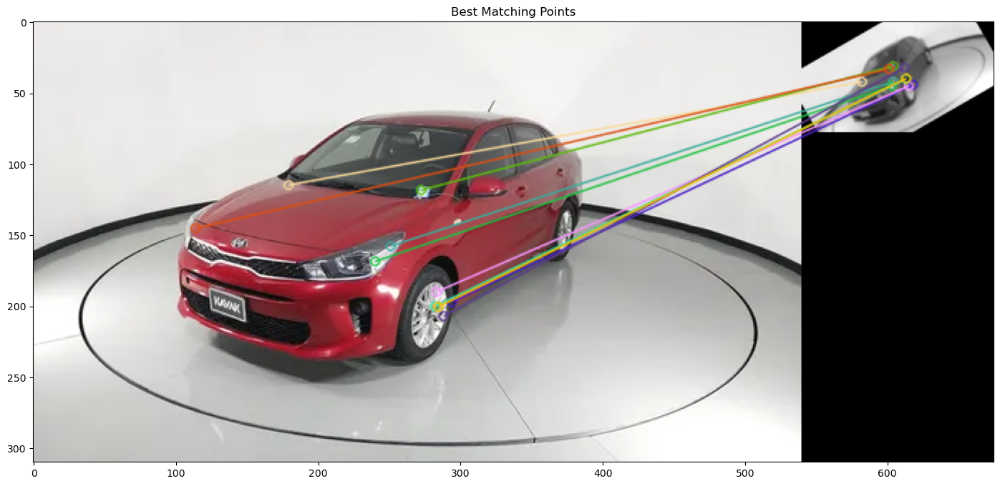


Number of Matching Keypoints Between The Training and Query Images:  10


In [41]:
applyORB(cv2.imread('data/homework/image_matching/car_1.jpeg'))

##### SIFT:

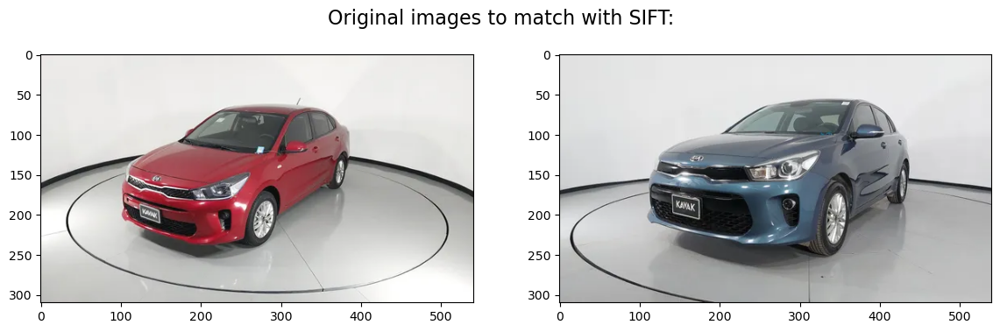

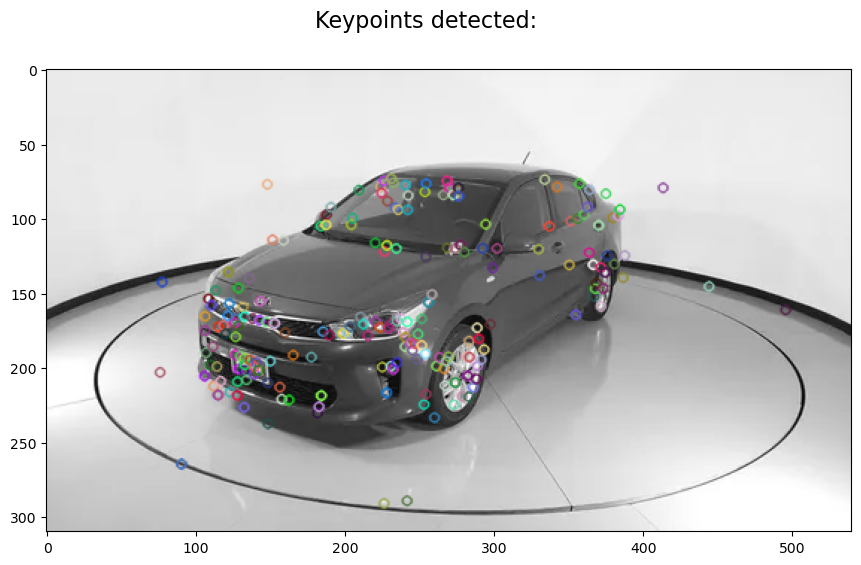

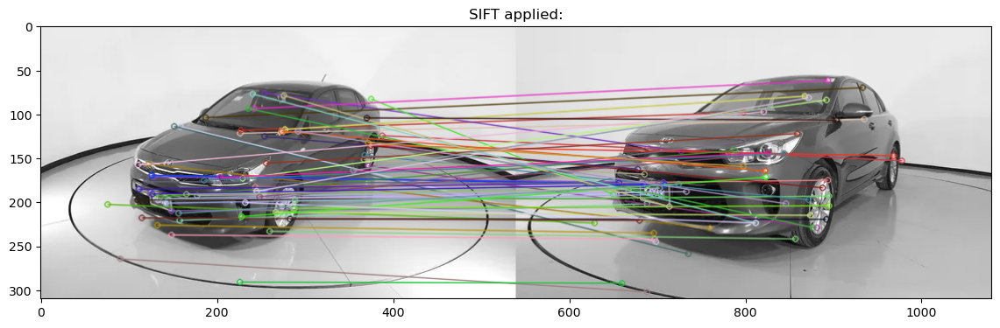

In [42]:
applySIFT(
    cv2.imread('data/homework/image_matching/car_1.jpeg'),
    cv2.imread('data/homework/image_matching/car_2.jpeg')
)

In [43]:
# TODO: Conclusions.

### City skyline:

##### ORB:

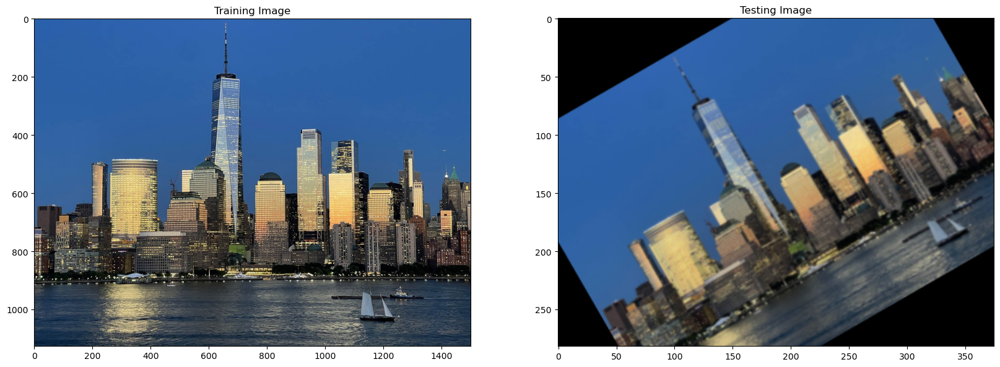

<Figure size 1400x400 with 0 Axes>

<Figure size 1400x400 with 0 Axes>

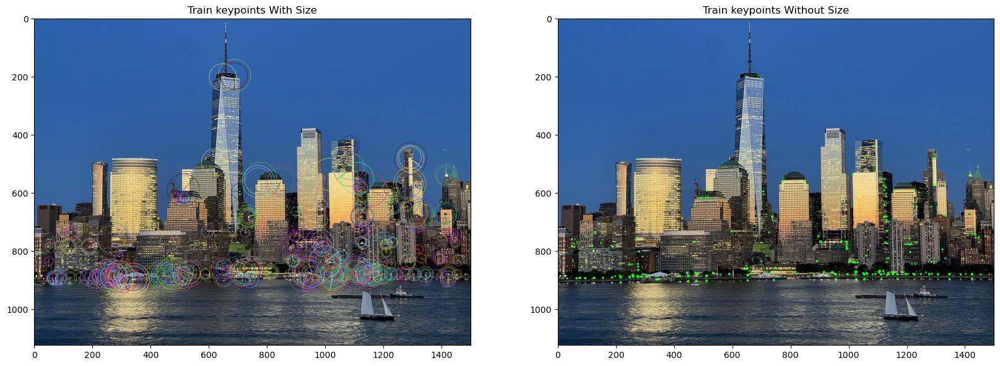

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  489


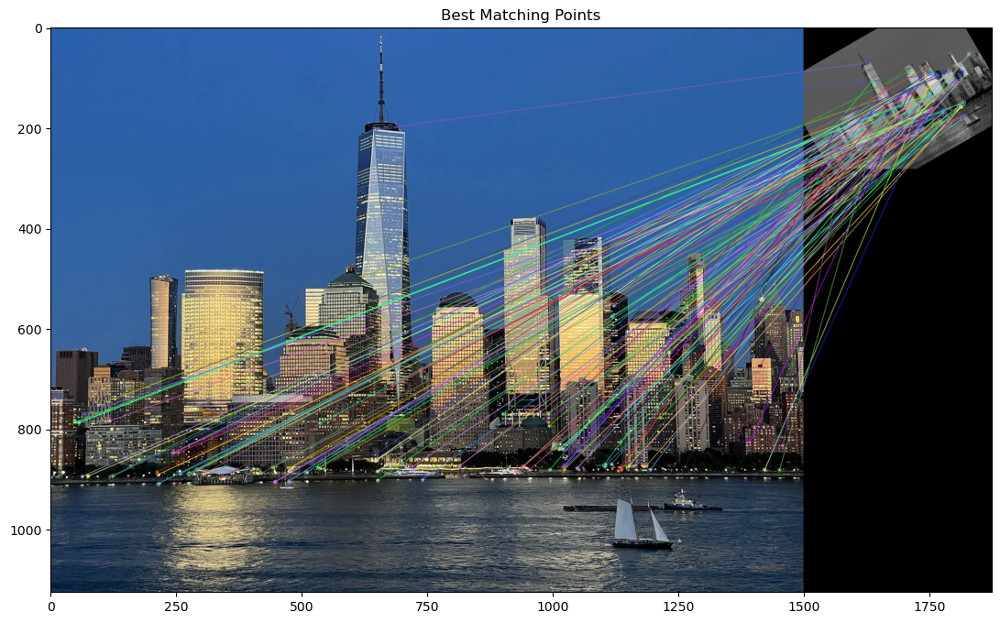


Number of Matching Keypoints Between The Training and Query Images:  136


In [44]:
applyORB(cv2.imread('data/homework/image_matching/skyline_1.jpeg'))

##### SIFT:

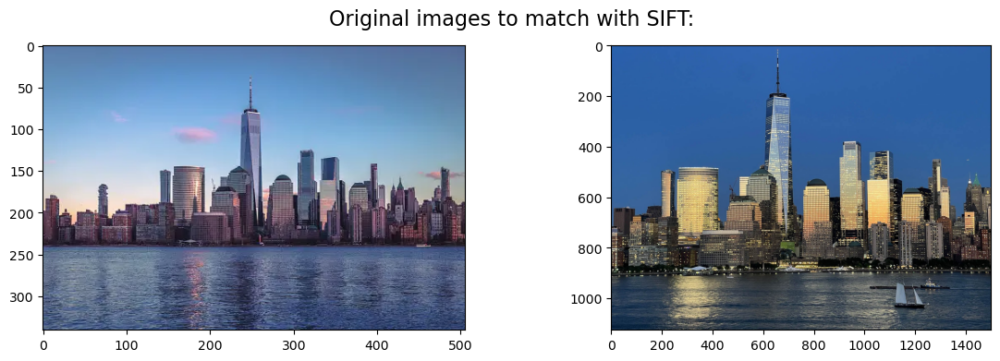

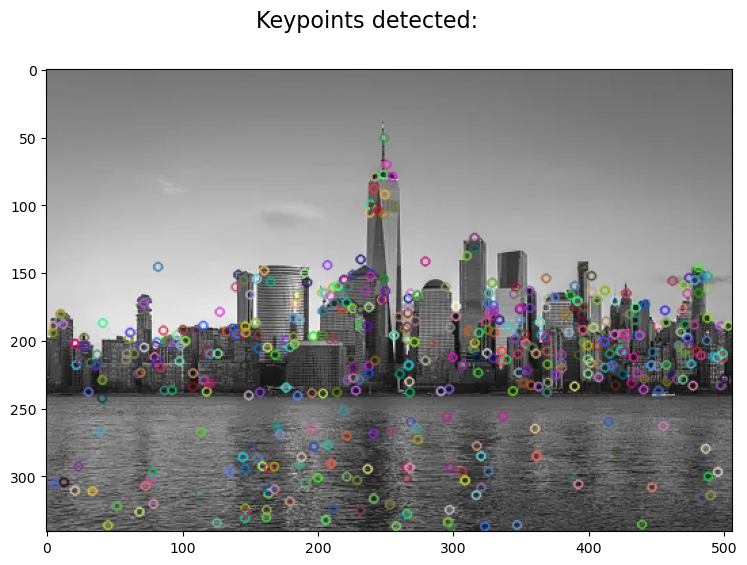

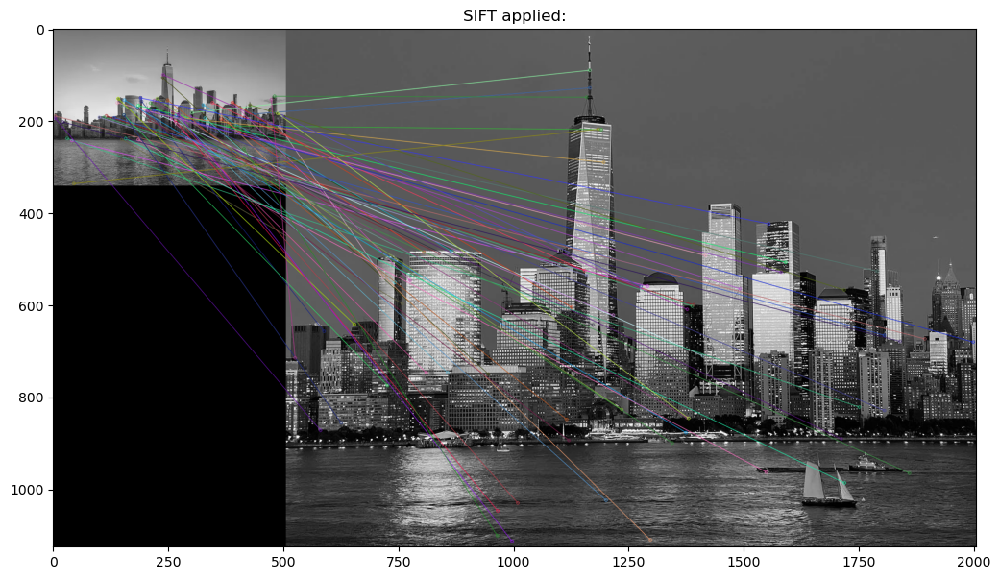

In [45]:
applySIFT(
    cv2.imread('data/homework/image_matching/skyline_2.jpeg'),
    cv2.imread('data/homework/image_matching/skyline_1.jpeg')
)

In [46]:
# TODO: Conclusions.

### Church:

##### ORB:

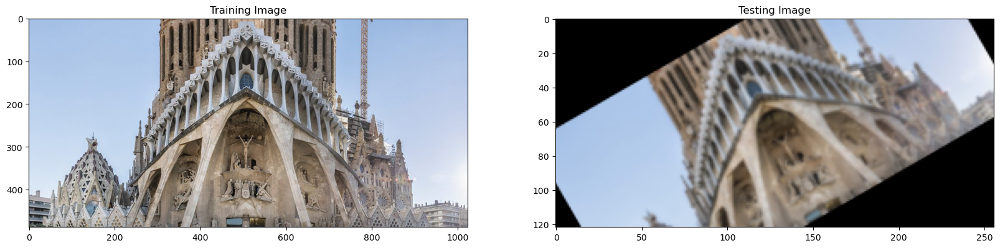

<Figure size 1400x400 with 0 Axes>

<Figure size 1400x400 with 0 Axes>

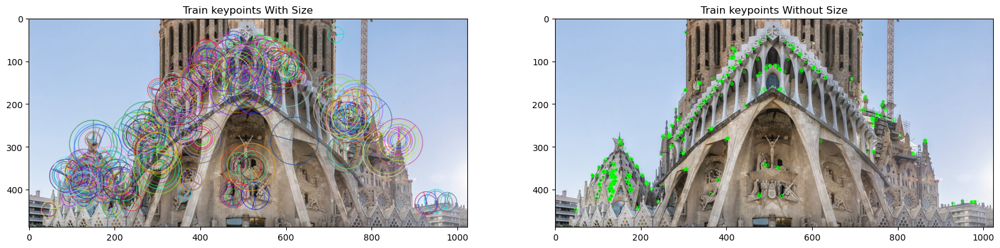

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  294


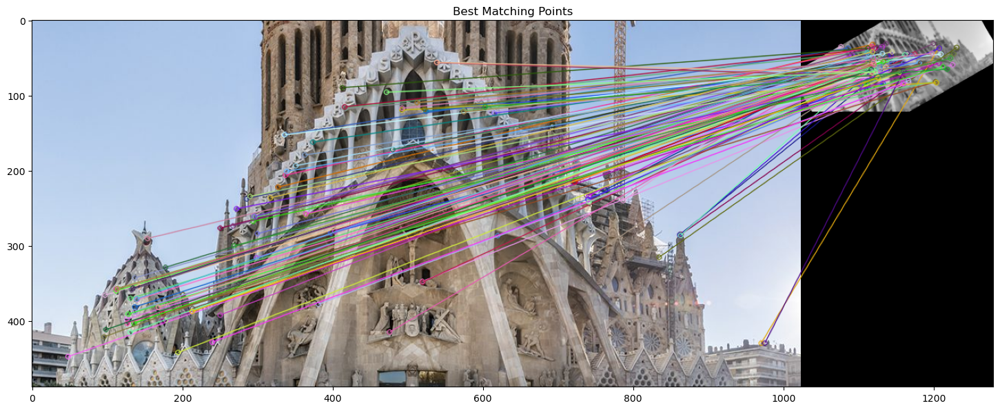


Number of Matching Keypoints Between The Training and Query Images:  109


In [47]:
applyORB(cv2.imread('data/homework/image_matching/church_1.jpeg'))

##### SIFT:

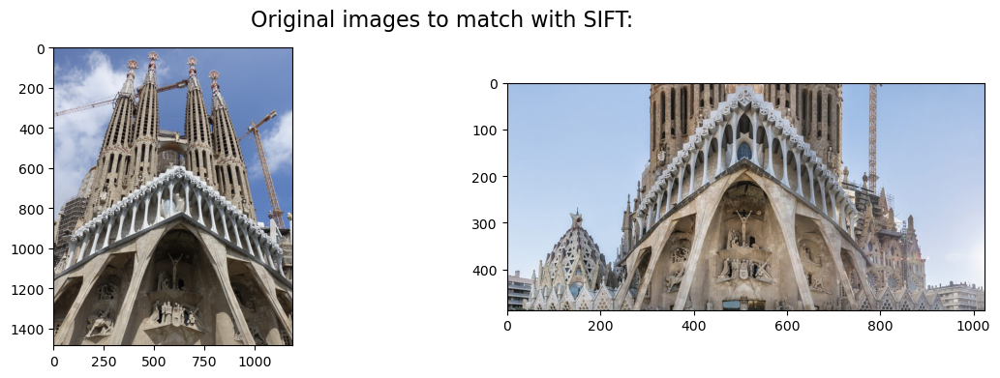

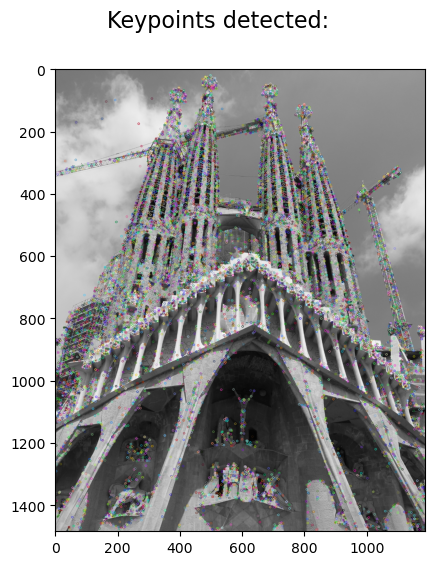

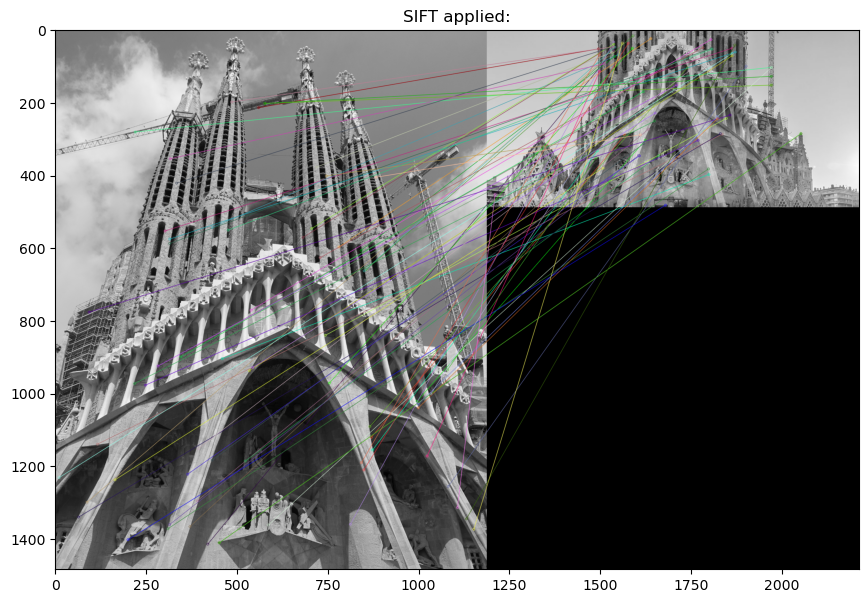

In [50]:
applySIFT(
    cv2.imread('data/homework/image_matching/church_2.jpeg'),
    cv2.imread('data/homework/image_matching/church_1.jpeg')
)

In [ ]:
# TODO: Conclusions.